In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

In [2]:
fpt_stock = pd.read_csv('D:/Cuong/Fin/FPT.csv')

In [3]:
fpt_stock

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
0,FPT,12/25/2018 9:15,30.89,30.89,30.89,30.89,35410,0
1,FPT,12/25/2018 9:16,30.81,30.81,30.81,30.81,190,0
2,FPT,12/25/2018 9:17,30.74,30.81,30.74,30.74,1120,0
3,FPT,12/25/2018 9:18,30.74,30.74,30.74,30.74,2120,0
4,FPT,12/25/2018 9:19,30.74,30.74,30.74,30.74,22500,0
...,...,...,...,...,...,...,...,...
97401,FPT,12/22/2020 14:24,58.20,58.20,58.20,58.20,27470,0
97402,FPT,12/22/2020 14:25,58.20,58.20,58.20,58.20,14820,0
97403,FPT,12/22/2020 14:26,58.20,58.20,58.20,58.20,500,0
97404,FPT,12/22/2020 14:29,58.10,58.10,58.10,58.10,2500,0


In [28]:
fpt_stock['Date/Time'] = pd.to_datetime(fpt_stock['Date/Time'], format='%m/%d/%Y %H:%M')

In [29]:
fpt_stock

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
0,FPT,2018-12-25 09:15:00,30.89,30.89,30.89,30.89,35410,0
1,FPT,2018-12-25 09:16:00,30.81,30.81,30.81,30.81,190,0
2,FPT,2018-12-25 09:17:00,30.74,30.81,30.74,30.74,1120,0
3,FPT,2018-12-25 09:18:00,30.74,30.74,30.74,30.74,2120,0
4,FPT,2018-12-25 09:19:00,30.74,30.74,30.74,30.74,22500,0
...,...,...,...,...,...,...,...,...
97401,FPT,2020-12-22 14:24:00,58.20,58.20,58.20,58.20,27470,0
97402,FPT,2020-12-22 14:25:00,58.20,58.20,58.20,58.20,14820,0
97403,FPT,2020-12-22 14:26:00,58.20,58.20,58.20,58.20,500,0
97404,FPT,2020-12-22 14:29:00,58.10,58.10,58.10,58.10,2500,0


In [32]:
fig = go.Figure(data=[go.Candlestick(x=fpt_stock['Date/Time'],
                open=fpt_stock['Open'],
                high=fpt_stock['High'],
                low=fpt_stock['Low'],
                close=fpt_stock['Close'])])

# Update layout
fig.update_layout(title='Stock Price Candlestick Chart',
                  xaxis_title='Date and Time',
                  yaxis_title='Stock Price',
                  xaxis_rangeslider_visible=False)

# Show the plot
fig.show()

In [41]:
present = fpt_stock['Close'][0] 

In [42]:
present

30.89

In [45]:
# Calculate the price differences
fpt_stock['Price_Difference'] = fpt_stock['Close'] - present

# Calculate the standard deviation of price differences
volatility_array = fpt_stock['Price_Difference']


In [46]:
volatility_array

0         0.00
1        -0.08
2        -0.15
3        -0.15
4        -0.15
         ...  
97401    27.31
97402    27.31
97403    27.31
97404    27.21
97405    27.21
Name: Price_Difference, Length: 97406, dtype: float64

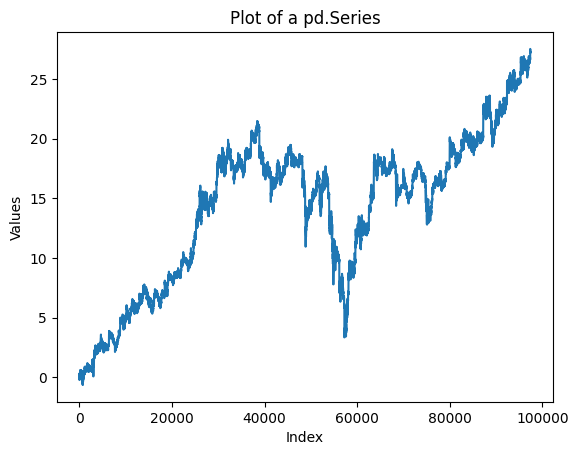

In [48]:
plt.plot(volatility_array)
plt.title('Plot of a pd.Series')
plt.xlabel('Index')
plt.ylabel('Values')
plt.show()

In [49]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [51]:
X = fpt_stock[['Open', 'High', 'Low', 'Close']]

In [52]:
X

,Open,High,Low,Close
0,30.89,30.89,30.89,30.89
1,30.81,30.81,30.81,30.81
2,30.74,30.81,30.74,30.74
3,30.74,30.74,30.74,30.74
4,30.74,30.74,30.74,30.74
...,...,...,...,...
97401,58.20,58.20,58.20,58.20
97402,58.20,58.20,58.20,58.20
97403,58.20,58.20,58.20,58.20
97404,58.10,58.10,58.10,58.10


In [53]:
X_train, X_test, y_train, y_test = train_test_split(X, volatility_array, test_size=0.2, random_state=42)

Using Linear Regression 

In [54]:
# Create a Linear Regression model
model = LinearRegression()

# Fit the model on the training data
model.fit(X_train, y_train)

LinearRegression()

In [55]:
y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

In [56]:
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

Mean Squared Error: 5.85420472285604e-29
R-squared: 1.0


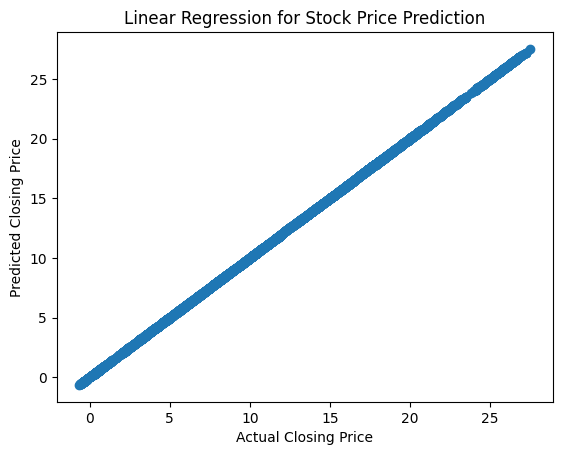

In [57]:
plt.scatter(y_test, y_pred)
plt.xlabel("Actual Closing Price")
plt.ylabel("Predicted Closing Price")
plt.title("Linear Regression for Stock Price Prediction")
plt.show()

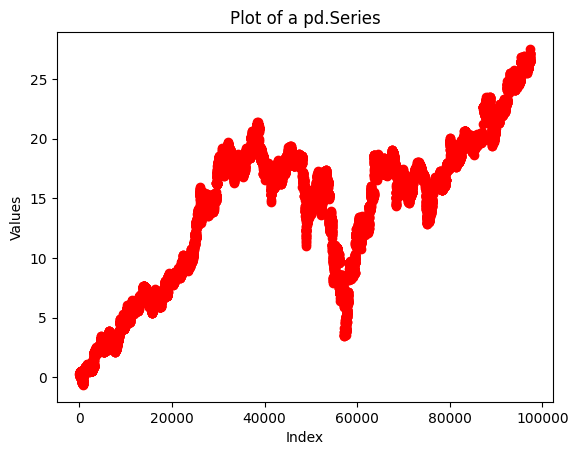

In [59]:
plt.scatter(y_test.index, y_pred, color='red', marker='o', label='Predicted Closing Price')
plt.title('Plot of a pd.Series')
plt.xlabel('Index')
plt.ylabel('Values')
plt.show()

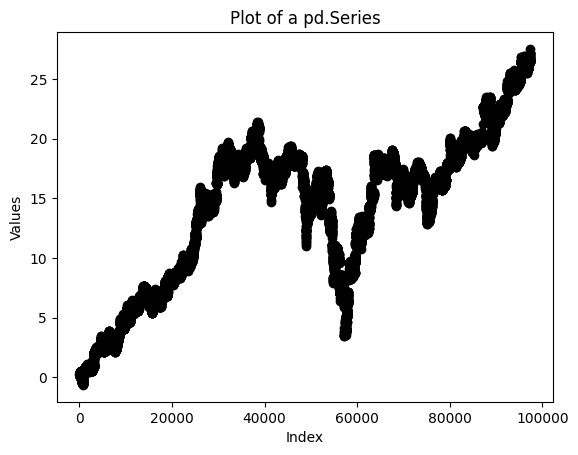

In [60]:
plt.scatter(y_test.index, y_test, color='black', label='Actual Closing Price')
plt.title('Plot of a pd.Series')
plt.xlabel('Index')
plt.ylabel('Values')
plt.show()

Using LSTM

In [61]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense

In [62]:
X = X.values
y = volatility_array.values

In [63]:
y

array([ 0.  , -0.08, -0.15, ..., 27.31, 27.21, 27.21])

In [64]:
# Normalize the data
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)
y_scaled = scaler.fit_transform(y.reshape(-1, 1))

In [65]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=42)


In [66]:
# Reshape the data for LSTM input (samples, time steps, features)
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

In [67]:
# Create an LSTM model
model = Sequential()
model.add(LSTM(50, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

# Fit the model on the training data
model.fit(X_train, y_train, epochs=30, batch_size=32, validation_data=(X_test, y_test), verbose=2)


Epoch 1/30
2436/2436 - 32s - loss: 0.0030 - val_loss: 2.4321e-06 - 32s/epoch - 13ms/step
Epoch 2/30
2436/2436 - 10s - loss: 1.8962e-06 - val_loss: 1.2800e-06 - 10s/epoch - 4ms/step
Epoch 3/30
2436/2436 - 10s - loss: 1.1345e-06 - val_loss: 8.7332e-07 - 10s/epoch - 4ms/step
Epoch 4/30
2436/2436 - 9s - loss: 1.3616e-06 - val_loss: 4.2511e-06 - 9s/epoch - 4ms/step
Epoch 5/30
2436/2436 - 10s - loss: 1.3725e-06 - val_loss: 2.2770e-06 - 10s/epoch - 4ms/step
Epoch 6/30
2436/2436 - 10s - loss: 1.3212e-06 - val_loss: 9.2260e-07 - 10s/epoch - 4ms/step
Epoch 7/30
2436/2436 - 10s - loss: 1.2910e-06 - val_loss: 8.2821e-07 - 10s/epoch - 4ms/step
Epoch 8/30
2436/2436 - 10s - loss: 1.2828e-06 - val_loss: 6.6714e-07 - 10s/epoch - 4ms/step
Epoch 9/30
2436/2436 - 10s - loss: 1.1713e-06 - val_loss: 1.5695e-06 - 10s/epoch - 4ms/step
Epoch 10/30
2436/2436 - 10s - loss: 1.1051e-06 - val_loss: 7.5425e-07 - 10s/epoch - 4ms/step
Epoch 11/30
2436/2436 - 9s - loss: 1.0281e-06 - val_loss: 6.7622e-07 - 9s/epoch - 4m

In [68]:
model.save_weights('LSTM.h5')